## Importing important libraries

In [3]:
#!pip install imblearn

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from collections import Counter
import imblearn
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

## Loading Drybeans dataset

In [5]:
drybean = pd.read_excel("Dry_Bean_Dataset.xlsx")
drybean

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


This dataset has 13611 sample observations, 16 different feature of beans and a class of beans. 

### Attribute Information:


1.) Area (A): The area of a bean zone and the number of pixels within its boundaries.

2.) Perimeter (P): Bean circumference is defined as the length of its border.

3.) Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.

4.) Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.

5.) Aspect ratio (K): Defines the relationship between L and l.

6.) Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.

7.) Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.

8.) Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.

9.) Extent (Ex): The ratio of the pixels in the bounding box to the bean area.

10.)Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.

11.)Roundness (R): Calculated with the following formula: (4piA)/(P^2)

12.)Compactness (CO): Measures the roundness of an object: Ed/L

13.)ShapeFactor1 (SF1)

14.)ShapeFactor2 (SF2)

15.)ShapeFactor3 (SF3)

16.)ShapeFactor4 (SF4)

17.)Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)




In [6]:
drybean.shape

(13611, 17)

In [8]:
#checking the different types of beans in target feature 
drybean.Class.value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

In [9]:
drybean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

Total no of observation : 13611
Total no of features    : 17

Out of 17 features, 16 features are Numerical and one that is "Class" is categorical Data type

And All are non NAN 
    

In [10]:
drybean.nunique()

Area               12011
Perimeter          13416
MajorAxisLength    13543
MinorAxisLength    13543
AspectRation       13543
Eccentricity       13543
ConvexArea         12066
EquivDiameter      12011
Extent             13535
Solidity           13526
roundness          13543
Compactness        13543
ShapeFactor1       13543
ShapeFactor2       13543
ShapeFactor3       13543
ShapeFactor4       13543
Class                  7
dtype: int64

From the above observation it is clea that there are very less duplicate values in the dataset. From above, can say that dataset has maximum unique value in each feature

In [11]:
drybean.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

There is no any NAN value in the entire dataset means no missing values.

In [9]:
# Descriptive Analysis

drybean.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,13611.0,53048.284549,29324.095717,20420.000000,36328.000000,44652.000000,61332.000000,254616.000000
Perimeter,13611.0,855.283459,214.289696,524.736000,703.523500,794.941000,977.213000,1985.370000
MajorAxisLength,13611.0,320.141867,85.694186,183.601165,253.303633,296.883367,376.495012,738.860153
MinorAxisLength,13611.0,202.270714,44.970091,122.512653,175.848170,192.431733,217.031741,460.198497
AspectRation,13611.0,1.583242,0.246678,1.024868,1.432307,1.551124,1.707109,2.430306
Eccentricity,13611.0,0.750895,0.092002,0.218951,0.715928,0.764441,0.810466,0.911423
ConvexArea,13611.0,53768.200206,29774.915817,20684.000000,36714.500000,45178.000000,62294.000000,263261.000000
EquivDiameter,13611.0,253.064220,59.177120,161.243764,215.068003,238.438026,279.446467,569.374358
Extent,13611.0,0.749733,0.049086,0.555315,0.718634,0.759859,0.786851,0.866195
Solidity,13611.0,0.987143,0.004660,0.919246,0.985670,0.988283,0.990013,0.994677


In [15]:
#Checking duplicated item
drybean.duplicated().sum()

0

There is very less duplicates so we can directily drop them. 

In [16]:
#droped duplicated items
drybean.drop_duplicates(inplace = True)

In [17]:
#Again checking for confirmation
drybean.duplicated().sum()

0

In [18]:
#checheing unique value in traget class
drybean.Class.value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1860
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

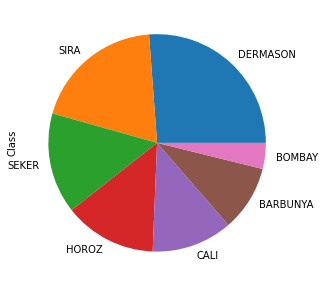

In [19]:
 #Visualization of target class seaborn countplot
plt.figure(figsize = (10,5))
drybean.Class.value_counts().plot(kind='pie')
plt.show()

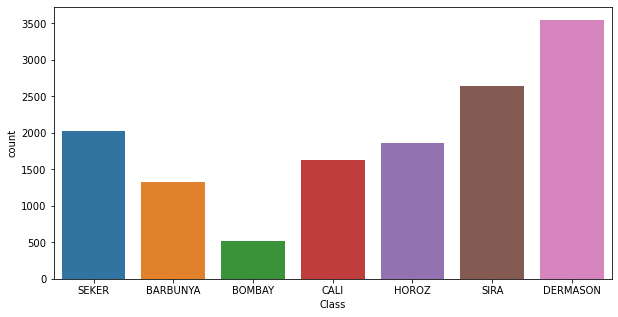

In [20]:
#Visualization of target class seaborn countplot
plt.figure(figsize = (10,5))
sb.countplot(x="Class", data = drybean)
plt.show()

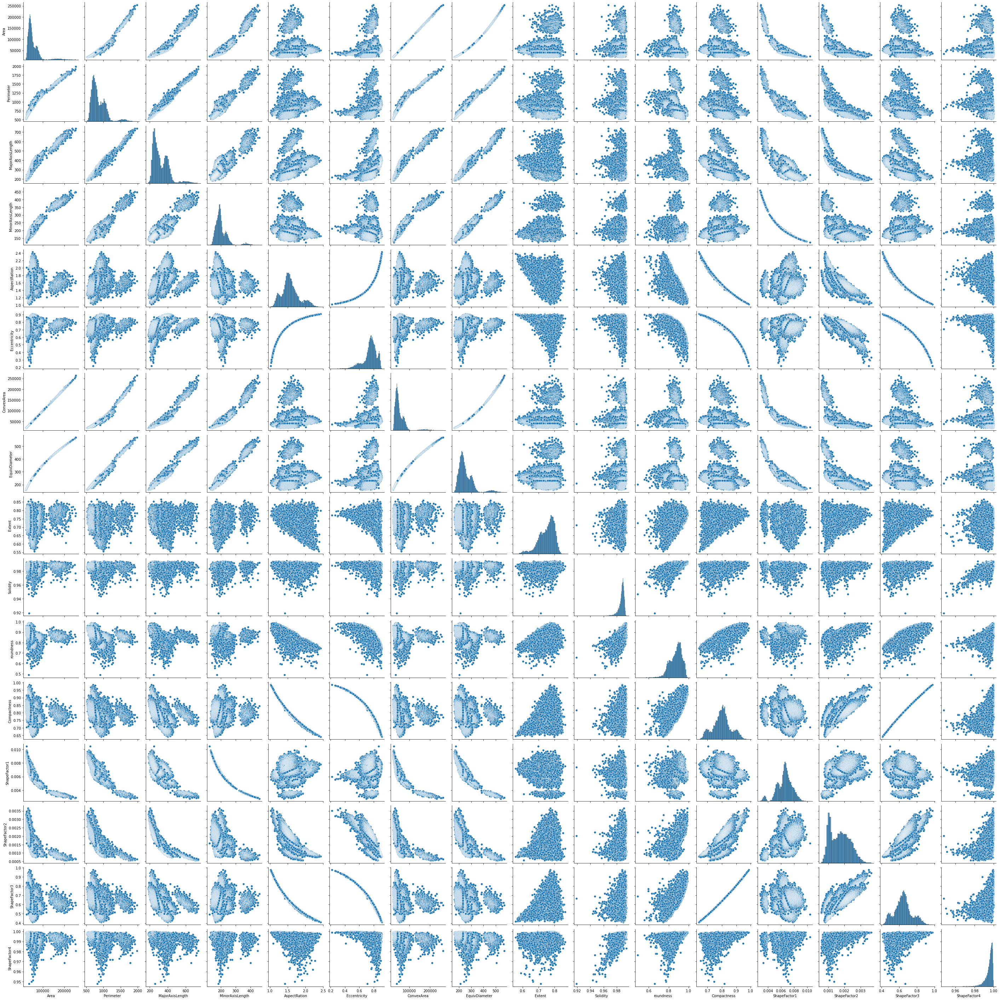

In [16]:
sb.pairplot(drybean)

In [22]:
plt.savefig('Drybean_Pairplot.png')

<Figure size 432x288 with 0 Axes>

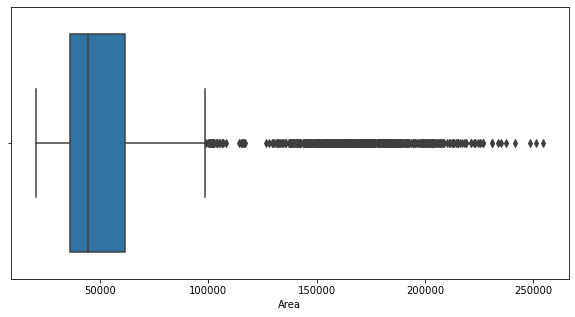

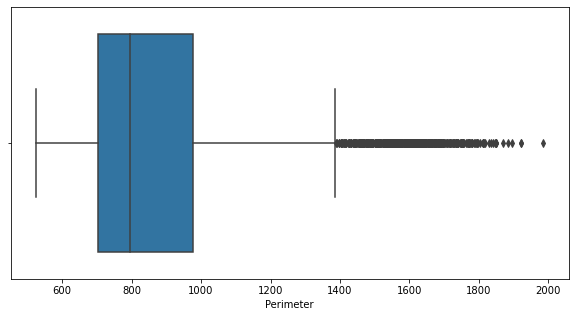

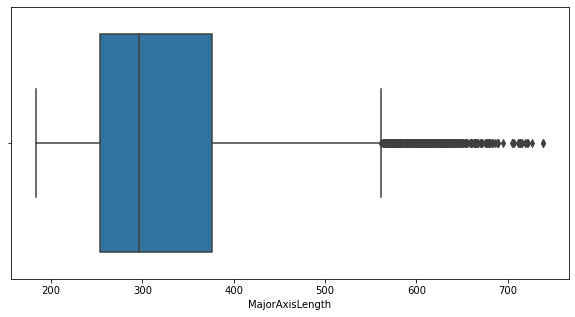

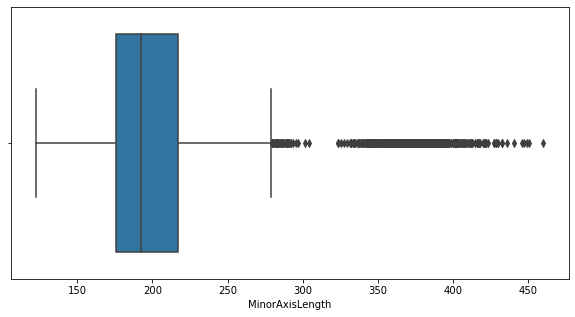

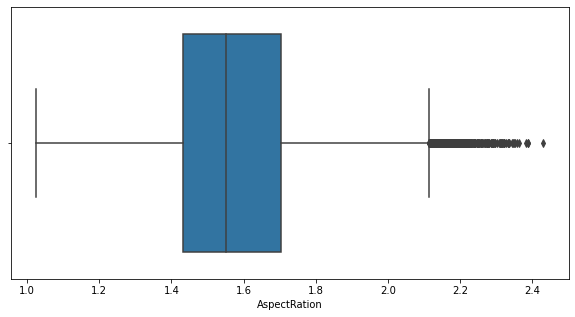

...

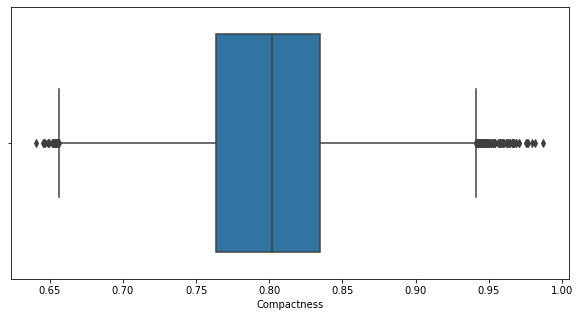

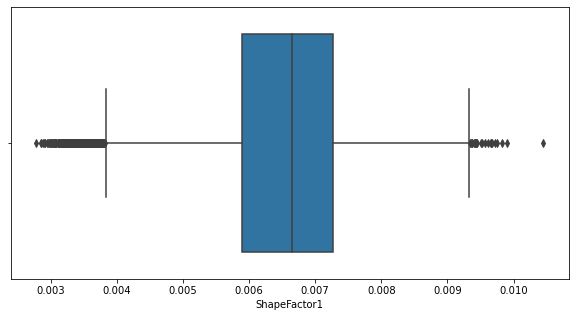

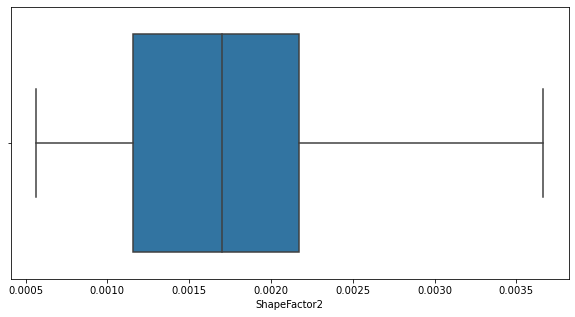

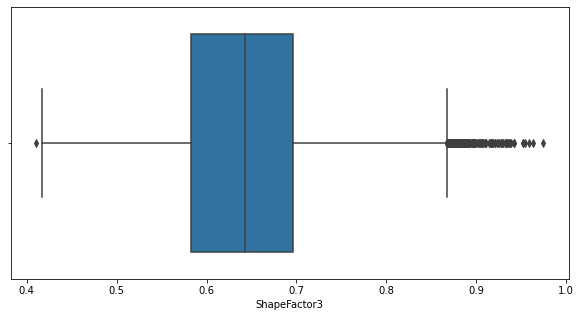

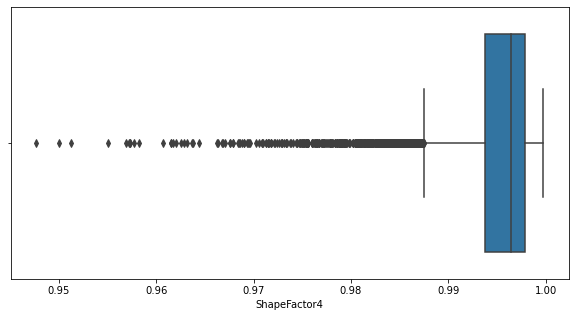

In [23]:
#checking outlier using box and whisker plot

for features in drybean.columns:
    if features =="Class":
        continue
    else:
        plt.figure(figsize = (10,5))
        sb.boxplot(data = drybean, x = features)
        plt.show()

From the above observations, it seems that has alot of outliers.

In [24]:
#Mannual Checking of outlier

drybean_Area = drybean["Area"]
Q3 = drybean_Area.quantile(0.75)
Q1 = drybean_Area.quantile(0.25)
median = drybean_Area.quantile(0.50)
IQR = Q3-Q1
lower_limit = Q1-1.5*IQR
upper_limit = Q3+1.5*IQR
Area_outlier = drybean_Area[(drybean_Area<lower_limit) | (drybean_Area>upper_limit)]
Area_outlier

3344    100846
3345    102015
3346    102379
3347    105542
3348    115967
         ...  
5496    106806
5497    107911
5498    114858
5499    115608
5500    116272
Name: Area, Length: 551, dtype: int64

In [25]:
#Mannual Checking of outlier

drybean_EquivDiameter = drybean["EquivDiameter"]
Q3_E = drybean_EquivDiameter.quantile(0.75)
Q1_E = drybean_EquivDiameter.quantile(0.25)
median_E = drybean_EquivDiameter.quantile(0.50)
IQR_E = Q3_E-Q1_E
lower_limit_E = Q1_E-1.5*IQR_E
upper_limit_E = Q3_E+1.5*IQR_E
EquivDiameter_outlier = drybean_EquivDiameter[(drybean_EquivDiameter<lower_limit_E) | (drybean_EquivDiameter>upper_limit_E)]
EquivDiameter_outlier

#print(type(EquivDiameter_outlier))

3348    384.257427
3349    380.991340
3350    386.021135
3351    401.333555
3352    403.887242
           ...    
3869    565.803115
3870    569.374358
5498    382.415674
5499    383.662192
5500    384.762405
Name: EquivDiameter, Length: 526, dtype: float64

In [26]:
#Mannual Checking of outlier

drybean_Perimeter = drybean["Perimeter"]
Q3_P = drybean_Perimeter.quantile(0.75)
Q1_P = drybean_Perimeter.quantile(0.25)
median_P = drybean_Perimeter.quantile(0.50)
IQR_P = Q3_P-Q1_P
lower_limit_P = Q1_P-1.5*IQR_P
upper_limit_P = Q3_P+1.5*IQR_P
Perimeter_outlier = drybean_Perimeter[(drybean_Perimeter<lower_limit_P) | (drybean_Perimeter>upper_limit_P)]
Perimeter_outlier

#print(type(EquivDiameter_outlier))

3364    1391.532
3368    1432.713
3369    1427.056
3371    1417.944
3372    1389.634
          ...   
3866    1921.685
3867    1895.940
3868    1884.557
3869    1919.868
3870    1985.370
Name: Perimeter, Length: 500, dtype: float64

In [27]:
#Mannual Checking of outlier

drybean_MajorAxisLength = drybean["MajorAxisLength"]
Q3_Major = drybean_MajorAxisLength.quantile(0.75)
Q1_Major = drybean_MajorAxisLength.quantile(0.25)
median_Major = drybean_MajorAxisLength.quantile(0.50)
IQR_Major = Q3_Major-Q1_Major
lower_limit_Major = Q1_Major-1.5*IQR_Major
upper_limit_Major = Q3_Major+1.5*IQR_Major
MajorAxisLength_outlier = drybean_MajorAxisLength[(drybean_MajorAxisLength<lower_limit_Major) | (drybean_MajorAxisLength>upper_limit_Major)]
MajorAxisLength_outlier

#print(type(EquivDiameter_outlier))

3426    581.235920
3427    564.968608
3429    563.717847
3431    562.823437
3434    582.438203
           ...    
3866    738.144502
3867    726.373493
3868    715.053040
3869    719.125690
3870    738.860153
Name: MajorAxisLength, Length: 379, dtype: float64

In [28]:
#Mannual Checking of outlier

drybean_MinorAxisLength = drybean["MinorAxisLength"]
Q3_Minor = drybean_MinorAxisLength.quantile(0.75)
Q1_Minor = drybean_MinorAxisLength.quantile(0.25)
median_Minor = drybean_MinorAxisLength.quantile(0.50)
IQR_Minor = Q3_Minor-Q1_Minor
lower_limit_Minor = Q1_Minor-1.5*IQR_Minor
upper_limit_Minor = Q3_Minor+1.5*IQR_Minor
MinorAxisLength_outlier = drybean_MinorAxisLength[(drybean_MinorAxisLength<lower_limit_Minor) | (drybean_MinorAxisLength>upper_limit_Minor)]
MinorAxisLength_outlier

#print(type(EquivDiameter_outlier))

3088    285.347398
3142    289.499746
3144    280.253937
3171    285.445525
3187    280.276974
           ...    
5495    291.873017
5497    279.350337
5498    287.561719
5499    296.898826
5500    279.783414
Name: MinorAxisLength, Length: 567, dtype: float64

In [29]:
#Mannual Checking of outlier

drybean_AspectRation = drybean["AspectRation"]
Q3_AR = drybean_AspectRation.quantile(0.75)
Q1_AR = drybean_AspectRation.quantile(0.25)
median_AR = drybean_AspectRation.quantile(0.50)
IQR_AR = Q3_AR-Q1_AR
lower_limit_AR = Q1_AR-1.5*IQR_AR
upper_limit_AR = Q3_AR+1.5*IQR_AR
AspectRation_outlier = drybean_AspectRation[(drybean_AspectRation<lower_limit_AR) | (drybean_AspectRation>upper_limit_AR)]
AspectRation_outlier


5568    2.166477
5569    2.152470
5571    2.181283
5589    2.143499
5591    2.126985
          ...   
7409    2.163426
7413    2.150992
7416    2.211116
7425    2.188484
7427    2.120117
Name: AspectRation, Length: 485, dtype: float64

In [31]:
#Mannual Checking of outlier

drybean_Eccentricity = drybean["Eccentricity"]
Q3_ECC = drybean_Eccentricity.quantile(0.75)
Q1_ECC = drybean_Eccentricity.quantile(0.25)
median_ECC = drybean_Eccentricity.quantile(0.50)
IQR_ECC = Q3_ECC-Q1_ECC
lower_limit_ECC = Q1_ECC-1.5*IQR_ECC
upper_limit_ECC = Q3_ECC+1.5*IQR_ECC
Eccentricity_outlier = drybean_Eccentricity[(drybean_Eccentricity<lower_limit_ECC) | (drybean_Eccentricity>upper_limit_ECC)]
Eccentricity_outlier

0        0.549812
1        0.411785
2        0.562727
3        0.498616
4        0.333680
           ...   
10156    0.543073
10342    0.558009
10422    0.564972
11454    0.539964
11564    0.562780
Name: Eccentricity, Length: 833, dtype: float64

In [32]:
#Mannual Checking of outlier

drybean_Extent = drybean["Extent"]
Q3_ET = drybean_Extent.quantile(0.75)
Q1_ET = drybean_Extent.quantile(0.25)
median_ET = drybean_Extent.quantile(0.50)
IQR_ET = Q3_ET-Q1_ET
lower_limit_ET = Q1_ET-1.5*IQR_ET
upper_limit_ET = Q3_ET+1.5*IQR_ET
Extent_outlier = drybean_Extent[(drybean_Extent<lower_limit_ET) | (drybean_Extent>upper_limit_ET)]
Extent_outlier

3829    0.607021
5512    0.604603
5542    0.602807
5551    0.605216
5562    0.604743
          ...   
7377    0.578924
7409    0.607037
7416    0.579156
7419    0.605696
7427    0.612852
Name: Extent, Length: 271, dtype: float64

In [33]:
#Mannual Checking of outlier

drybean_Solidity = drybean["Solidity"]
Q3_S = drybean_Solidity.quantile(0.75)
Q1_S = drybean_Solidity.quantile(0.25)
median_S = drybean_Solidity.quantile(0.50)
IQR_S = Q3_S-Q1_S
lower_limit_S = Q1_S-1.5*IQR_S
upper_limit_S = Q3_S+1.5*IQR_S
Solidity_outlier = drybean_Solidity[(drybean_Solidity<lower_limit_S) | (drybean_Solidity>upper_limit_S)]
Solidity_outlier

3        0.976696
271      0.919246
278      0.975180
364      0.969160
788      0.976516
           ...   
13234    0.972663
13303    0.973551
13326    0.978738
13346    0.974994
13493    0.976974
Name: Solidity, Length: 774, dtype: float64

In [34]:
#Mannual Checking of outlier

drybean_roundness = drybean["roundness"]
Q3_r = drybean_roundness.quantile(0.75)
Q1_r = drybean_roundness.quantile(0.25)
median_r = drybean_roundness.quantile(0.50)
IQR_r = Q3_r-Q1_r
lower_limit_r = Q1_r-1.5*IQR_r
upper_limit_r = Q3_r+1.5*IQR_r
roundness_outlier = drybean_roundness[(drybean_roundness<lower_limit_r) | (drybean_roundness>upper_limit_r)]
roundness_outlier

271      0.658074
1233     0.595048
1352     0.694875
1726     0.698161
1800     0.700102
           ...   
10928    0.632321
11459    0.666121
11902    0.691447
11907    0.489618
12116    0.666784
Name: roundness, Length: 98, dtype: float64

In [35]:
#Mannual Checking of outlier

drybean_Compactness = drybean["Compactness"]
Q3_c = drybean_Compactness.quantile(0.75)
Q1_c = drybean_Compactness.quantile(0.25)
median_c = drybean_Compactness.quantile(0.50)
IQR_c = Q3_c-Q1_c
lower_limit_c = Q1_c-1.5*IQR_c
upper_limit_c = Q3_c+1.5*IQR_c
Compactness_outlier = drybean_Compactness[(drybean_Compactness<lower_limit_c) | (drybean_Compactness>upper_limit_c)]
Compactness_outlier

1       0.953861
4       0.970516
11      0.945254
25      0.956197
30      0.941749
          ...   
7030    0.653079
7104    0.655473
7316    0.654380
7329    0.655368
7362    0.653472
Name: Compactness, Length: 124, dtype: float64

In [36]:
#Mannual Checking of outlier

drybean_ShapeFactor1 = drybean["ShapeFactor1"]
Q3_s1 = drybean_ShapeFactor1.quantile(0.75)
Q1_s1 = drybean_ShapeFactor1.quantile(0.25)
median_s1 = drybean_ShapeFactor1.quantile(0.50)
IQR_s1 = Q3_s1-Q1_s1
lower_limit_s1 = Q1_s1-1.5*IQR_s1
upper_limit_s1 = Q3_s1+1.5*IQR_s1
ShapeFactor1_outlier = drybean_ShapeFactor1[(drybean_ShapeFactor1<lower_limit_s1) | (drybean_ShapeFactor1>upper_limit_s1)]
ShapeFactor1_outlier

3350     0.003639
3351     0.003761
3353     0.003743
3354     0.003800
3355     0.003742
           ...   
10218    0.009612
10223    0.009400
10239    0.009575
10259    0.009662
10344    0.009517
Name: ShapeFactor1, Length: 533, dtype: float64

In [37]:
#Mannual Checking of outlier

drybean_ShapeFactor2 = drybean["ShapeFactor2"]
Q3_s2 = drybean_ShapeFactor2.quantile(0.75)
Q1_s2 = drybean_ShapeFactor2.quantile(0.25)
median_s2 = drybean_ShapeFactor2.quantile(0.50)
IQR_s2 = Q3_s2-Q1_s2
lower_limit_s2 = Q1_s2-1.5*IQR_s2
upper_limit_s2 = Q3_s2+1.5*IQR_s2
ShapeFactor2_outlier = drybean_ShapeFactor2[(drybean_ShapeFactor2<lower_limit_s2) | (drybean_ShapeFactor2>upper_limit_s2)]
ShapeFactor2_outlier

Series([], Name: ShapeFactor2, dtype: float64)

In [38]:
#Mannual Checking of outlier

drybean_ShapeFactor3 = drybean["ShapeFactor3"]
Q3_s3 = drybean_ShapeFactor3.quantile(0.75)
Q1_s3 = drybean_ShapeFactor3.quantile(0.25)
median_s3 = drybean_ShapeFactor3.quantile(0.50)
IQR_s3 = Q3_s3-Q1_s3
lower_limit_s3 = Q1_s3-1.5*IQR_s3
upper_limit_s3 = Q3_s3+1.5*IQR_s3
ShapeFactor3_outlier = drybean_ShapeFactor3[(drybean_ShapeFactor3<lower_limit_s3) | (drybean_ShapeFactor3>upper_limit_s3)]
ShapeFactor3_outlier

1       0.909851
4       0.941900
6       0.871186
11      0.893506
14      0.882132
          ...   
1871    0.920886
1995    0.870104
2179    0.877981
2239    0.874340
6186    0.410339
Name: ShapeFactor3, Length: 202, dtype: float64

In [39]:
#Mannual Checking of outlier

drybean_ShapeFactor4 = drybean["ShapeFactor4"]
Q3_s4 = drybean_ShapeFactor4.quantile(0.75)
Q1_s4 = drybean_ShapeFactor4.quantile(0.25)
median_s4 = drybean_ShapeFactor4.quantile(0.50)
IQR_s4 = Q3_s4-Q1_s4
lower_limit_s4 = Q1_s4-1.5*IQR_s4
upper_limit_s4 = Q3_s4+1.5*IQR_s4
ShapeFactor4_outlier = drybean_ShapeFactor4[(drybean_ShapeFactor4<lower_limit_s4) | (drybean_ShapeFactor4>upper_limit_s4)]
ShapeFactor4_outlier

271      0.947687
2132     0.986973
2174     0.982933
2199     0.987370
2235     0.983672
           ...   
12121    0.986469
12721    0.987248
13116    0.987121
13346    0.985495
13493    0.987382
Name: ShapeFactor4, Length: 760, dtype: float64

In [40]:
#Mannual Checking of outlier

drybean_ConvexArea = drybean["ConvexArea"]
Q3_ca = drybean_ConvexArea.quantile(0.75)
Q1_ca = drybean_ConvexArea.quantile(0.25)
median_ca = drybean_ConvexArea.quantile(0.50)
IQR_ca = Q3_ca-Q1_ca
lower_limit_ca = Q1_ca-1.5*IQR_ca
upper_limit_ca = Q3_ca+1.5*IQR_ca
ConvexArea_outlier = drybean_ConvexArea[(drybean_ConvexArea<lower_limit_ca) | (drybean_ConvexArea>upper_limit_ca)]
ConvexArea_outlier

3344    102015
3345    103901
3346    104111
3347    107112
3348    118497
         ...  
5496    108109
5497    110337
5498    115826
5499    117222
5500    118144
Name: ConvexArea, Length: 549, dtype: int64

So total Outliers Detail:


    1.Area               571
    2.Perimeter          500
    3.MajorAxisLength    379
    4.MinorAxisLength    567
    5.AspectRation       485
    6.Eccentricity       833
    7.ConvexArea         549
    8.EquivDiameter      526
    9.Extent             271
    10.Solidity          774
    11.roundness          98
    12.Compactness       124
    13.ShapeFactor1      533
    14.ShapeFactor2        0
    15.ShapeFactor3      202
    16.ShapeFactor4      760

In [41]:
drybean.Class.replace(["DERMASON","SIRA","SEKER","HOROZ","CALI","BARBUNYA","BOMBAY"],[1,2,3,4,5,6,7], inplace = True)

drybean.Class

0        3
1        3
2        3
3        3
4        3
        ..
13606    1
13607    1
13608    1
13609    1
13610    1
Name: Class, Length: 13543, dtype: int64

Here, changed categorical "Class" feature to numerical "Class" feature.


"DERMASON"   --> 1
"SIRA"       --> 2
"SEKER"      --> 3
"HOROZ"      --> 4
"CALI"       --> 5
"BARBUNYA"   --> 6
"BOMBAY"     --> 7





In [42]:
drybean.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,3
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,3
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,3
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,3
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,3


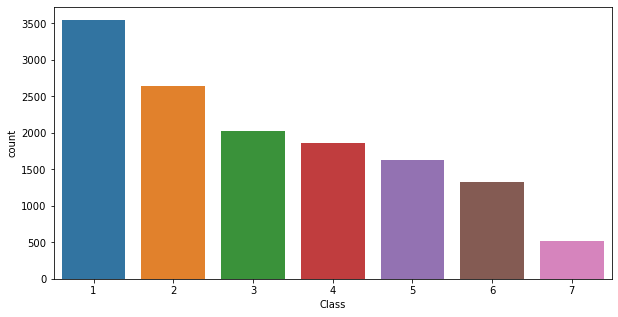

In [43]:
#Visualization of target class seaborn countplot
plt.figure(figsize = (10,5))
sb.countplot(x="Class", data = drybean)
plt.show()

Dataset is imbalance so first need to treate this one.

In [44]:
data = drybean.copy()
data

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,3
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,3
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,3
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,3
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,1
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,1
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,1
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,1


In [45]:
def detect_outliers(data, features):
    outlier_indices = []

    for c in features:
        Q1 = np.percentile(data[c], 25)
        Q3 = np.percentile(data[c], 75)
        IQR = Q3 - Q1
        outlier_step = IQR * 1.5
        outlier_list_col = data[(data[c] < Q1 - outlier_step) | (data[c] > Q3 + outlier_step)].index
        outlier_indices.extend(outlier_list_col)

    outlier_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i, v in outlier_indices.items() if v > 1)

    return multiple_outliers


data = data.drop(detect_outliers(data,['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation', 'Eccentricity',
                                       'ConvexArea', 'EquivDiameter', 'Extent', 'Solidity', 'roundness', 'Compactness', 'ShapeFactor1',
                                       'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']), axis=0).reset_index(drop=True)
print('Number of of samples in the dataset after removing outliers: %d' % len(data))

Number of of samples in the dataset after removing outliers: 12144


As we can see that data is imbalance to first we need to deal with imbalance data

In [47]:
X = data.drop(["Class"], axis = 1)
X

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724
1,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066
2,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236
3,30519,629.727,212.996755,182.737204,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345
4,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12139,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385
12140,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219
12141,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767
12142,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222


In [48]:
Y = data.Class
Y

0        3
1        3
2        3
3        3
4        3
        ..
12139    1
12140    1
12141    1
12142    1
12143    1
Name: Class, Length: 12144, dtype: int64

In [49]:
from imblearn.under_sampling import RandomUnderSampler

rs = RandomUnderSampler(random_state = 42)

print("Original dataset shape %s" % Counter(Y))

X_res,Y_res = rs.fit_resample(X,Y)

print("After undersample dataset shape %s" % Counter(Y_res))

X_res


Original dataset shape Counter({1: 3525, 2: 2611, 3: 1823, 4: 1535, 5: 1402, 6: 1248})
After undersample dataset shape Counter({1: 1248, 2: 1248, 3: 1248, 4: 1248, 5: 1248, 6: 1248})


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,25950,601.233,218.855891,151.319552,1.446316,0.722461,26322,181.770642,0.771862,0.985867,0.902114,0.830549,0.008434,0.002475,0.689812,0.997687
1,34283,692.028,256.305533,170.976560,1.499068,0.744985,34703,208.926952,0.709705,0.987897,0.899583,0.815148,0.007476,0.002036,0.664466,0.996080
2,40727,749.229,282.862627,183.699092,1.539815,0.760423,41210,227.717428,0.775811,0.988280,0.911723,0.805046,0.006945,0.001800,0.648099,0.997953
3,27975,622.083,238.039394,150.061605,1.586278,0.776265,28261,188.729638,0.761432,0.989880,0.908413,0.792850,0.008509,0.002074,0.628612,0.997153
4,25792,597.381,214.522310,153.371986,1.398706,0.699179,26121,181.216430,0.725922,0.987405,0.908222,0.844744,0.008317,0.002613,0.713592,0.998106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7483,96192,1220.012,448.888428,273.838300,1.639246,0.792373,97341,349.964939,0.811870,0.988196,0.812121,0.779626,0.004667,0.001063,0.607816,0.996360
7484,96319,1252.315,434.980462,283.482724,1.534416,0.758465,98108,350.195888,0.748731,0.981765,0.771782,0.805084,0.004516,0.001170,0.648161,0.994548
7485,97054,1265.438,428.821897,288.692278,1.485394,0.739441,99061,351.529502,0.774363,0.979740,0.761626,0.819756,0.004418,0.001231,0.672001,0.998186
7486,97060,1246.469,407.924022,303.898305,1.342304,0.667078,98830,351.540368,0.759944,0.982090,0.785032,0.861779,0.004203,0.001430,0.742663,0.996880


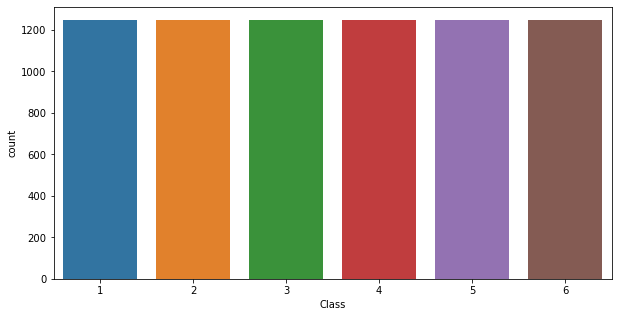

In [50]:
#Visualization of target class seaborn countplot
plt.figure(figsize = (10,5))
sb.countplot(x = Y_res)
plt.show()

Now my data is balanced so now ML algorithms can be applied.

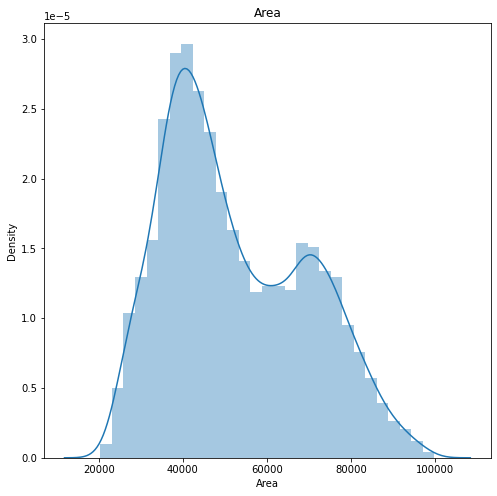

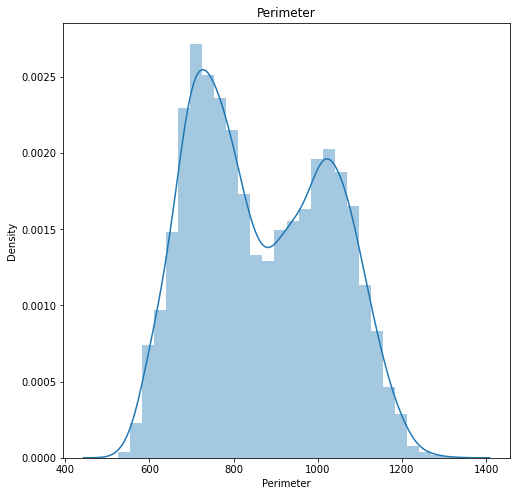

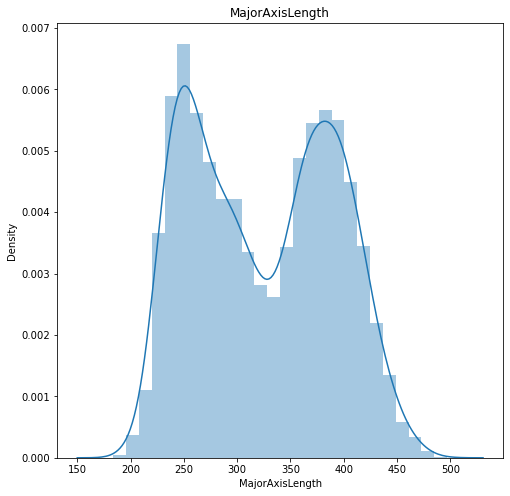

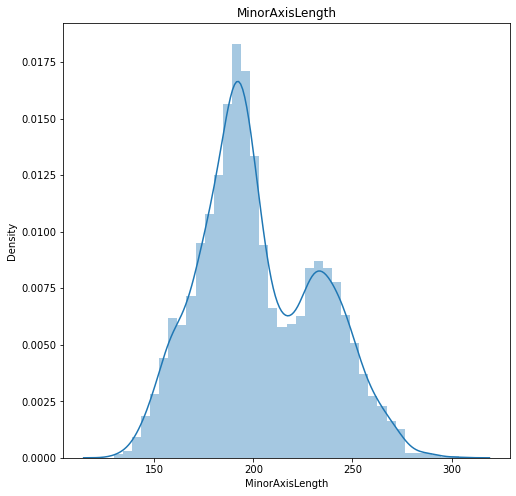

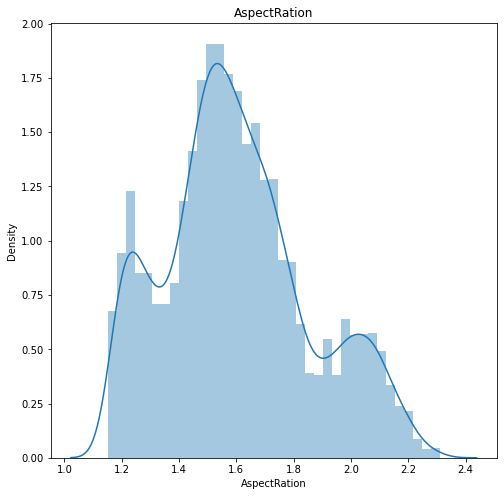

...

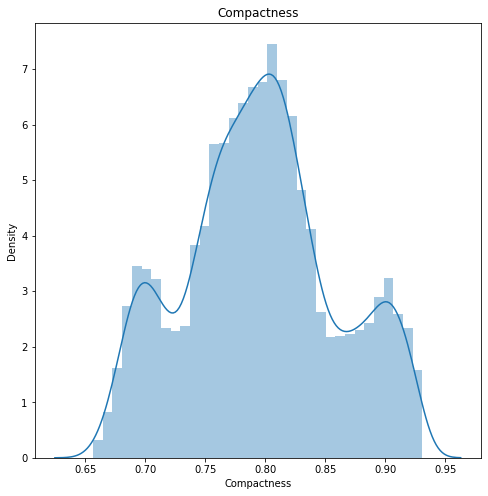

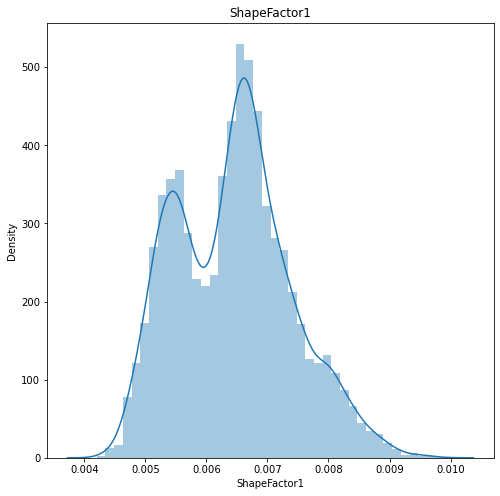

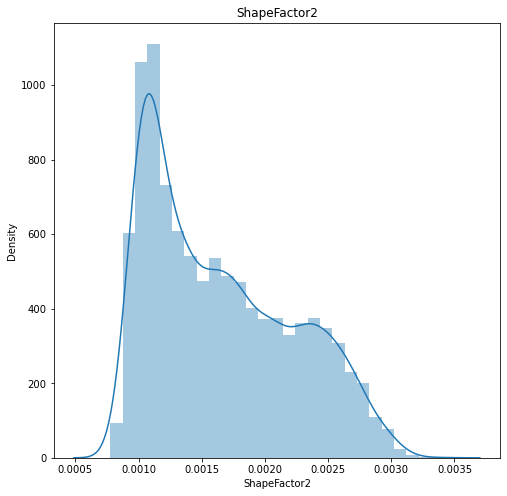

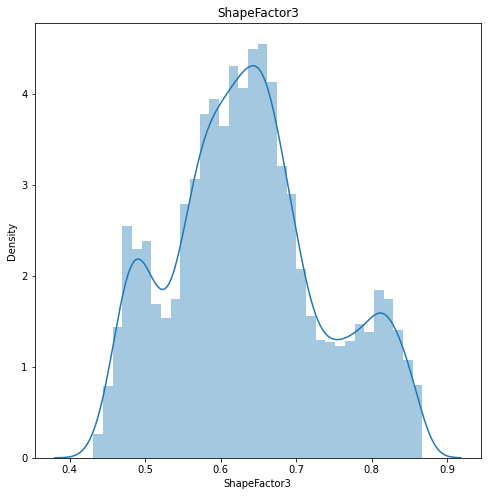

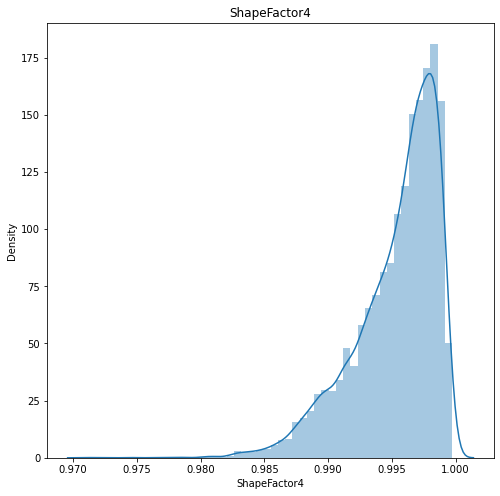

In [60]:
for features in X_res.columns:
    plt.figure(figsize = (8,8))
    sb.distplot(X_res[features])
    plt.title(features)
    plt.show()

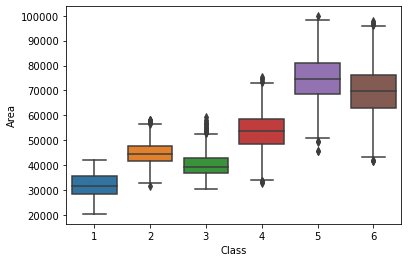

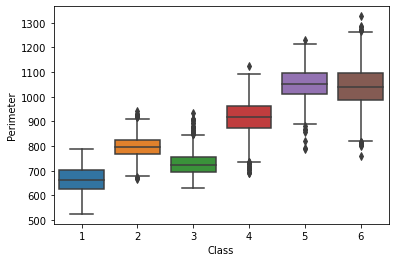

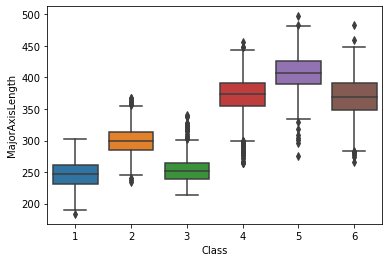

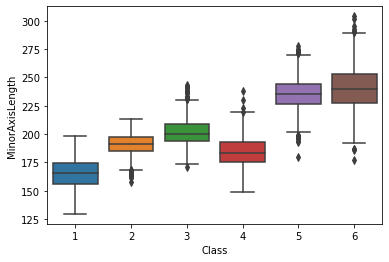

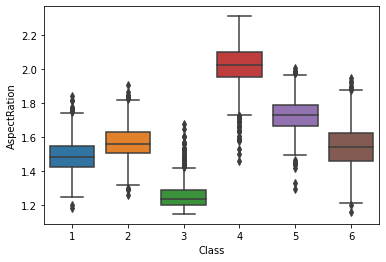

...

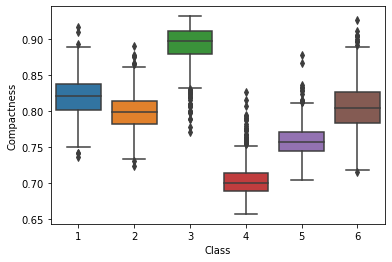

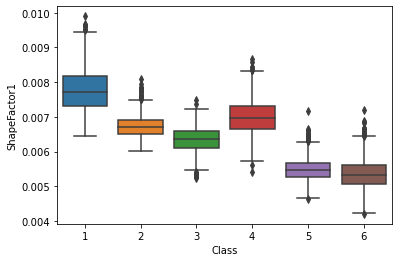

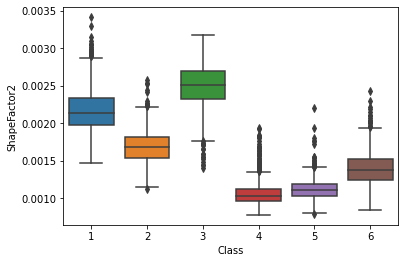

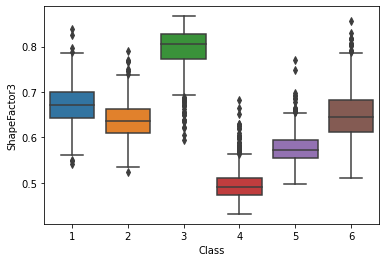

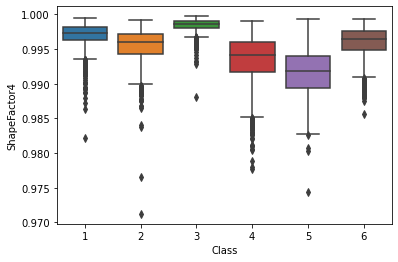

In [51]:
#Checking the Outlier in the independent feature

for feature in X_res.columns:
    sb.boxplot(x = Y_res, y = X_res[feature])
    plt.show()


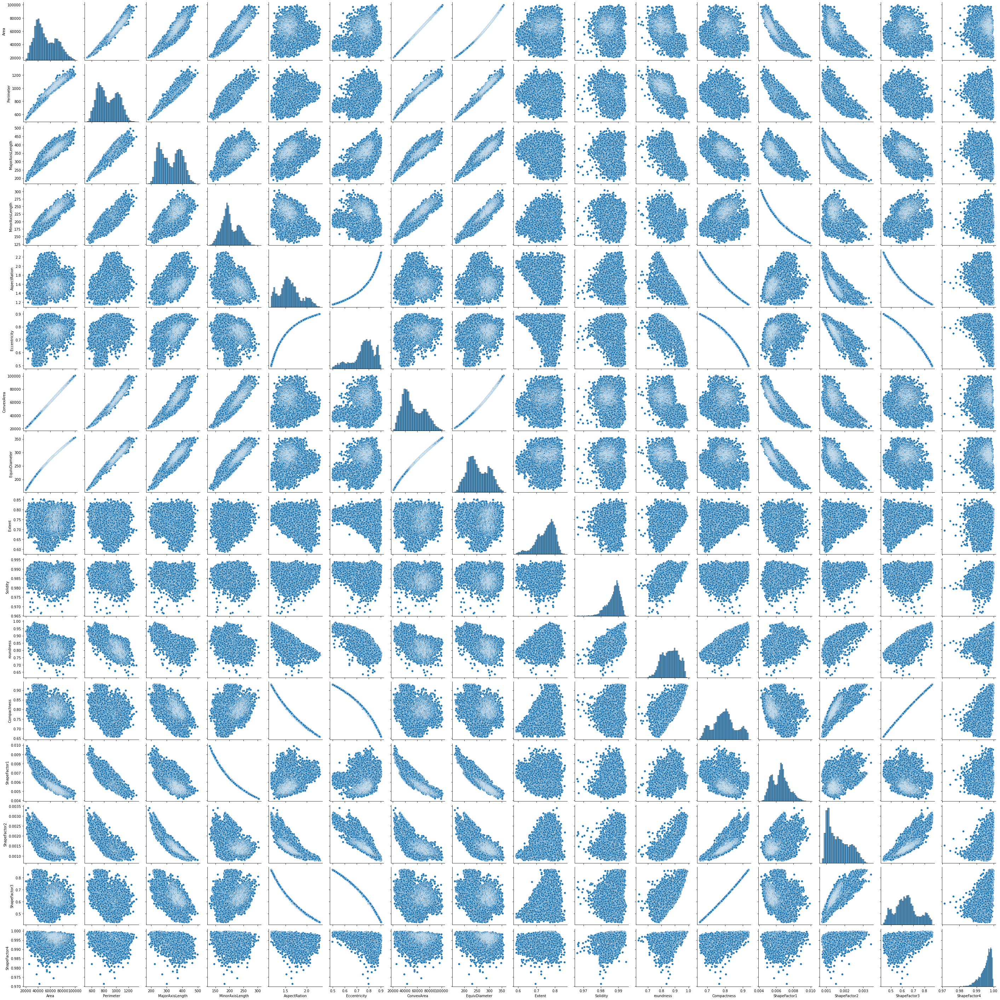

In [52]:
sb.pairplot(X_res)

In [53]:
df = X_res.copy()
df["Class"] = Y_res
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,25950,601.233,218.855891,151.319552,1.446316,0.722461,26322,181.770642,0.771862,0.985867,0.902114,0.830549,0.008434,0.002475,0.689812,0.997687,1
1,34283,692.028,256.305533,170.976560,1.499068,0.744985,34703,208.926952,0.709705,0.987897,0.899583,0.815148,0.007476,0.002036,0.664466,0.996080,1
2,40727,749.229,282.862627,183.699092,1.539815,0.760423,41210,227.717428,0.775811,0.988280,0.911723,0.805046,0.006945,0.001800,0.648099,0.997953,1
3,27975,622.083,238.039394,150.061605,1.586278,0.776265,28261,188.729638,0.761432,0.989880,0.908413,0.792850,0.008509,0.002074,0.628612,0.997153,1
4,25792,597.381,214.522310,153.371986,1.398706,0.699179,26121,181.216430,0.725922,0.987405,0.908222,0.844744,0.008317,0.002613,0.713592,0.998106,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7483,96192,1220.012,448.888428,273.838300,1.639246,0.792373,97341,349.964939,0.811870,0.988196,0.812121,0.779626,0.004667,0.001063,0.607816,0.996360,6
7484,96319,1252.315,434.980462,283.482724,1.534416,0.758465,98108,350.195888,0.748731,0.981765,0.771782,0.805084,0.004516,0.001170,0.648161,0.994548,6
7485,97054,1265.438,428.821897,288.692278,1.485394,0.739441,99061,351.529502,0.774363,0.979740,0.761626,0.819756,0.004418,0.001231,0.672001,0.998186,6
7486,97060,1246.469,407.924022,303.898305,1.342304,0.667078,98830,351.540368,0.759944,0.982090,0.785032,0.861779,0.004203,0.001430,0.742663,0.996880,6


In [54]:
df.corr()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
Area,1.000000,0.983496,0.930228,0.887897,0.382028,0.423788,0.999924,0.996711,-0.021335,-0.375855,-0.605715,-0.414721,-0.855996,-0.744468,-0.420897,-0.447165,0.838541
Perimeter,0.983496,1.000000,0.957044,0.834064,0.478413,0.507231,0.984344,0.988134,-0.081661,-0.449495,-0.729999,-0.505851,-0.808911,-0.811095,-0.510276,-0.468471,0.860913
MajorAxisLength,0.930228,0.957044,1.000000,0.669910,0.690154,0.695284,0.929966,0.938030,-0.143404,-0.369085,-0.756881,-0.710302,-0.649738,-0.922494,-0.711572,-0.553493,0.770832
MinorAxisLength,0.887897,0.834064,0.669910,1.000000,-0.068096,-0.014798,0.887929,0.885165,0.125044,-0.299706,-0.310244,0.036748,-0.984266,-0.391261,0.029192,-0.230168,0.792416
AspectRation,0.382028,0.478413,0.690154,-0.068096,1.000000,0.940096,0.381775,0.399397,-0.323857,-0.212039,-0.737841,-0.989553,0.080825,-0.865429,-0.981858,-0.505484,0.287195
Eccentricity,0.423788,0.507231,0.695284,-0.014798,0.940096,1.000000,0.424330,0.434273,-0.301885,-0.294181,-0.739409,-0.978300,0.044715,-0.900208,-0.986746,-0.528859,0.264270
ConvexArea,0.999924,0.984344,0.929966,0.887929,0.381775,0.424330,1.000000,0.996573,-0.023150,-0.386764,-0.610292,-0.414839,-0.855522,-0.744721,-0.421119,-0.450417,0.840101
EquivDiameter,0.996711,0.988134,0.938030,0.885165,0.399397,0.434273,0.996573,1.000000,-0.031560,-0.372456,-0.619441,-0.429308,-0.864448,-0.762778,-0.434555,-0.449017,0.849244
Extent,-0.021335,-0.081661,-0.143404,0.125044,-0.323857,-0.301885,-0.023150,-0.031560,1.000000,0.174140,0.297173,0.318200,-0.125588,0.242557,0.315321,0.127887,-0.029795
Solidity,-0.375855,-0.449495,-0.369085,-0.299706,-0.212039,-0.294181,-0.386764,-0.372456,0.174140,1.000000,0.643843,0.256490,0.248289,0.370587,0.267629,0.471379,-0.438217


<AxesSubplot:>

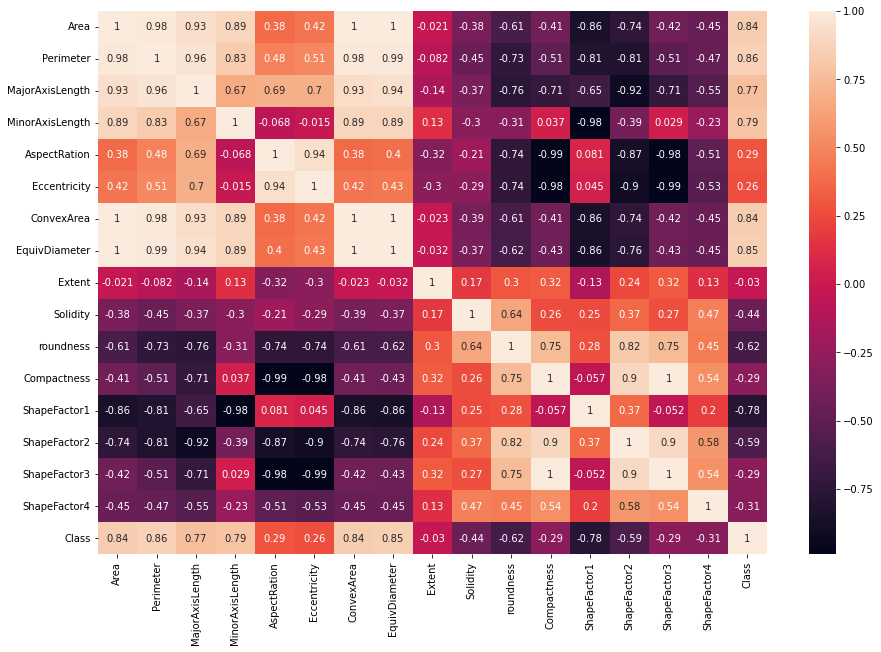

In [55]:
plt.figure(figsize=(15,10))
sb.heatmap(df.corr(),annot=True)

In [56]:
X_res.drop(['ConvexArea','Solidity', 'roundness','ShapeFactor4','Extent', 'AspectRation'], axis = 1, inplace = True)


<AxesSubplot:>

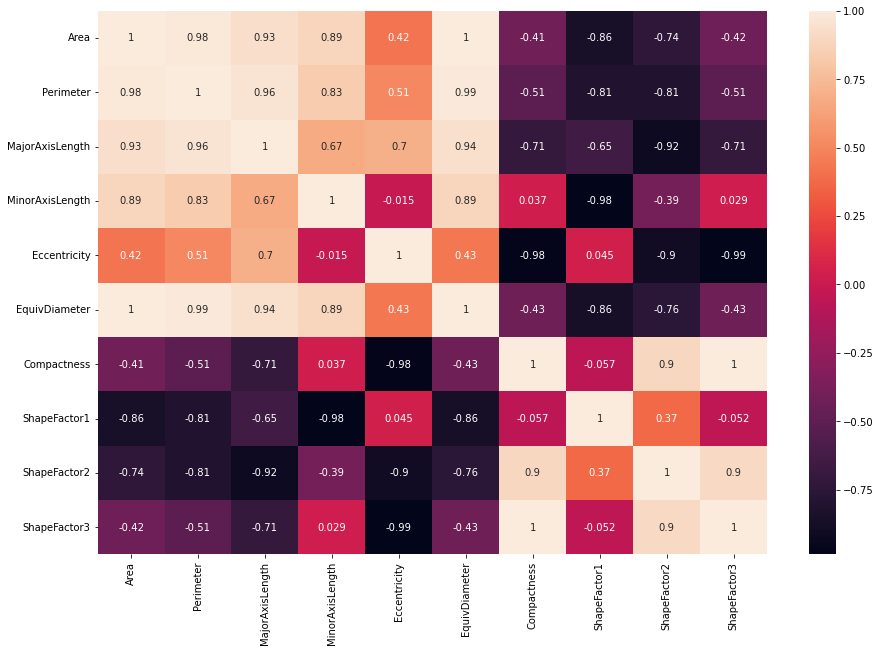

In [74]:
plt.figure(figsize=(15,10))
sb.heatmap(X_res.corr(),annot=True)

In [57]:
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(X_res,Y_res,test_size=0.25,random_state = 30)

from sklearn.linear_model import LogisticRegression

from sklearn import metrics

lr = LogisticRegression()

lr.fit(x_train,y_train)

LogisticRegression()

In [58]:
x_train.shape, y_train.shape,x_test.shape,y_test.shape

((5616, 10), (5616,), (1872, 10), (1872,))

In [59]:
pred_y = lr.predict(x_test)
pred_y

array([1, 3, 6, ..., 2, 2, 4], dtype=int64)

In [60]:
x_test

,Area,Perimeter,MajorAxisLength,MinorAxisLength,Eccentricity,EquivDiameter,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3
700,29307,627.269,228.296004,163.728085,0.696894,193.170472,0.846140,0.007790,0.002463,0.715954
3100,35736,684.029,235.661573,193.377658,0.571541,213.308435,0.905147,0.006595,0.002730,0.819292
6736,67437,1041.175,380.647880,226.566395,0.803568,293.024667,0.769805,0.005644,0.001223,0.592600
6689,66354,1007.809,342.848693,247.084100,0.693268,290.662238,0.847786,0.005167,0.001646,0.718741
7392,84185,1175.084,408.720527,263.644898,0.764141,327.395283,0.801025,0.004855,0.001233,0.641641
...,...,...,...,...,...,...,...,...,...,...
2051,44355,789.387,300.714314,188.435193,0.779321,237.643725,0.790264,0.006780,0.001631,0.624517
6394,58191,959.247,341.437891,217.441200,0.770996,272.196771,0.797207,0.005868,0.001462,0.635539
2257,47162,822.039,314.056865,192.494523,0.790138,245.048002,0.780266,0.006659,0.001523,0.608816
1441,47881,826.804,323.841214,189.497886,0.810920,246.908855,0.762438,0.006763,0.001410,0.581312


In [61]:
from sklearn.metrics import classification_report
report=classification_report(y_test,pred_y)
print(report)

              precision    recall  f1-score   support

           1       0.83      0.86      0.84       303
           2       0.78      0.80      0.79       315
           3       0.88      0.89      0.89       313
           4       0.94      0.92      0.93       316
           5       0.90      0.92      0.91       307
           6       0.88      0.83      0.85       318

    accuracy                           0.87      1872
   macro avg       0.87      0.87      0.87      1872
weighted avg       0.87      0.87      0.87      1872



In [62]:
from sklearn.metrics import accuracy_score

pred_y = lr.predict(x_test)

score =accuracy_score(y_test,pred_y)

In [63]:
score

0.8696581196581197